# Example rasters with neuropixels probe in X/Lman

In [1]:
import socket
import os
import glob
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from importlib import reload


import logging

# Setup the logger
logger = logging.getLogger()
logger.setLevel(logging.DEBUG)
formatter = logging.Formatter('%(asctime)s - %(name)s - %(levelname)s - %(message)s')

ch = logging.StreamHandler()
ch.setLevel(logging.INFO)
ch.setFormatter(formatter)
logger.addHandler(ch)
        
logger.info('Logger set')
logger.info('Hostname {}'.format(socket.gethostname()))


# Load my modules

from pipefinch.pipeline import rigutil
from pipefinch.pipeline import filestructure as et

from pipefinch.h5tools.kwik import kutil
from pipefinch.h5tools.kwik import event as ev
from pipefinch.h5tools.kwik import kwikfunctions as kwkf
from pipefinch.h5tools.kwik import kwdfunctions as kwdf

from pipefinch.neural.postsort import session

from pipefinch.pipeline import sglxutil as sglu

2019-08-09 11:13:46,137 - root - INFO - Logger set
2019-08-09 11:13:46,138 - root - INFO - Hostname zpikezorter


### Session parameters and raw files

In [2]:
# session parameters
sess_par = {'bird': 'g4r4',
           'sess': '20190715_02',
           'probe': 'probe_0', # probe to sort ('probe_0', 'probe_1') (to lookup in the rig_par which port to extract)
           'sort': 1, 
           'epoch': '20190715_02_dir_g0', # for the subfolder in the neuropix data}
           }


# visualization default parameters
viz_par = { 'evt_name': 'motif',
           'evt_signal': 'trig_perceptron',
            'evt_edge': 1,
            'pre_ms': -200,
            'post_ms': 800,
            
            'pre_samples': 0,
            'post_samples': 0,
            'span': 0,
            }

exp_struct = sglu.sgl_struct(sess_par, sess_par['epoch'])

logger.info('Raw folder {}'.format(exp_struct['folders']['raw']))

kwik_folder = exp_struct['folders']['kwik']
kwd_path = exp_struct['files']['kwd']
#exp_struct

2019-08-09 11:13:47,528 - root - INFO - Raw folder /mnt/microdrive/birds/g4r4/Ephys/raw/20190715_02/20190715_02_dir_g0


### instantiate a session object
 - create a session
 - load rig parameters
 - load the streams around the event (perceptron TTL, for now)
 - get the untis meta and sort them by site (~site 230-270 should be lman; lower than that is    X)

In [8]:
reload(session)
sess = session.SglSession(sess_par, viz_par)
sess.load_rig_par()
sess.get_event_ttl()
sess.load_mic_peri_event_streams()
sess.get_units_meta()

units_pd = sess.units_meta_pd
units_pd.sort_values('main_chan', ascending=False, inplace=True)
units_pd.head()

KeyError: 'tags'

## Plot one unit

In [4]:
# Change visualization parameters (pre/post window from the perceptron mark)
sess.viz_par.update({'pre_ms': -500, 'post_ms': 1500})
sess.reset_viz_par()
sess.load_mic_peri_event_streams()
fig = session.plot_unit_sgl(sess, 160, example_event_id=41);

KeyError: 'rec'

## Plot all the rasters for well isolated units, sorted by site (from dorsal to ventral)
### Sites ~230-280 should be LMAN
### Sites <280 should be X

/home/ezequiel/repos/pipefinch/pipefinch/neural/postsort/session.py:493: RuntimeWarning: invalid value encountered in greater
  a_raster[a_raster>span_ms-2] = np.nan
/home/ezequiel/anaconda3/envs/sort/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


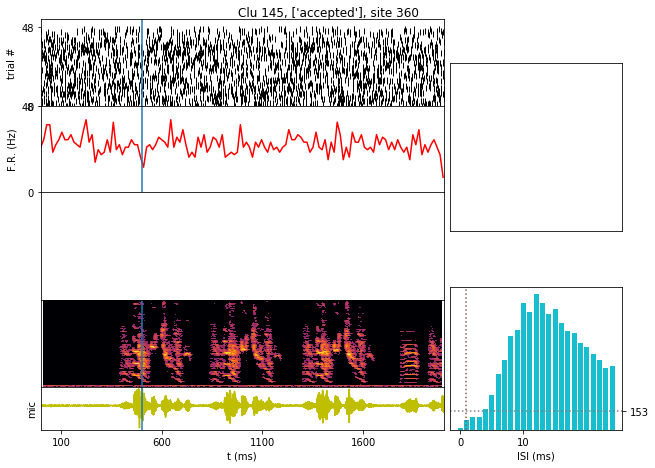

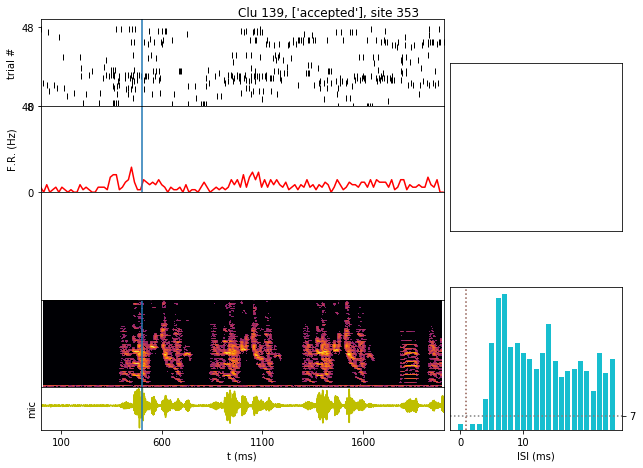

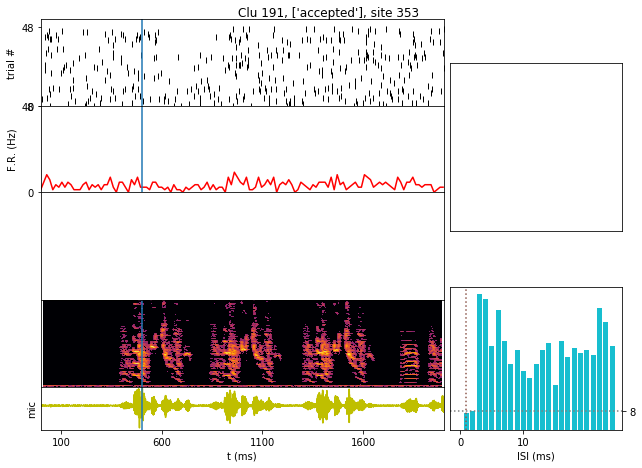

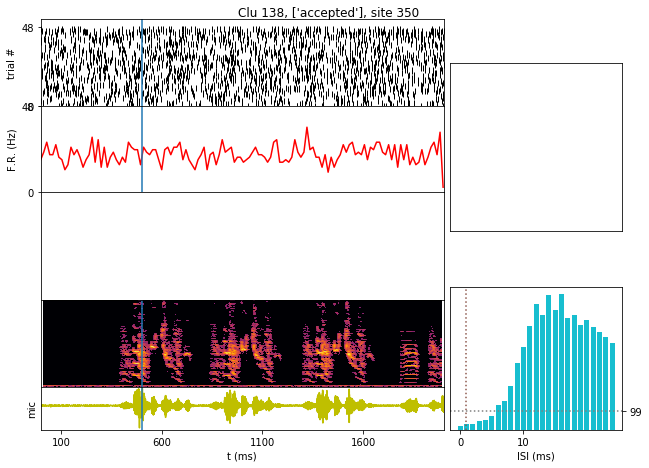

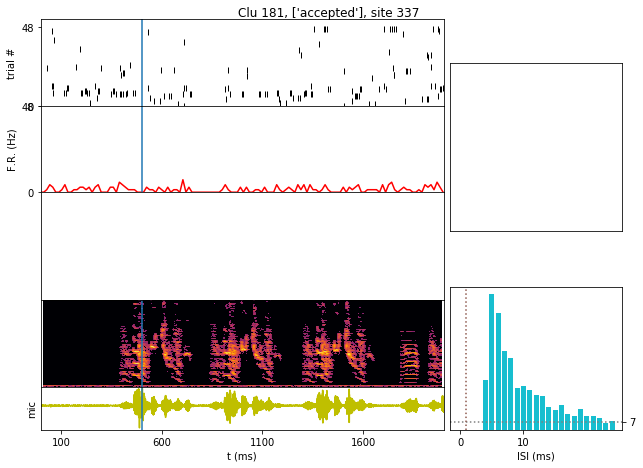

...

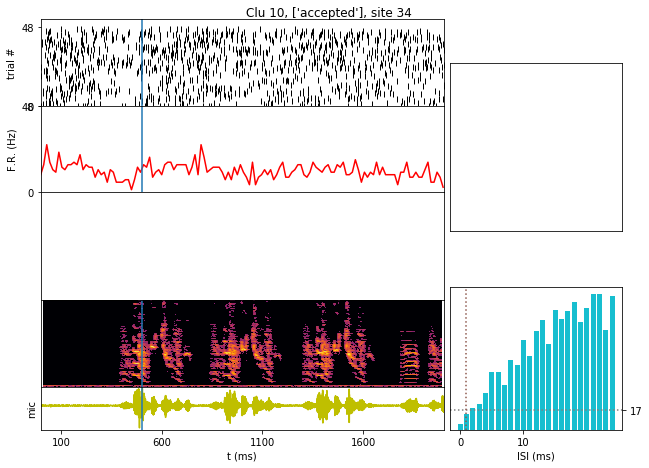

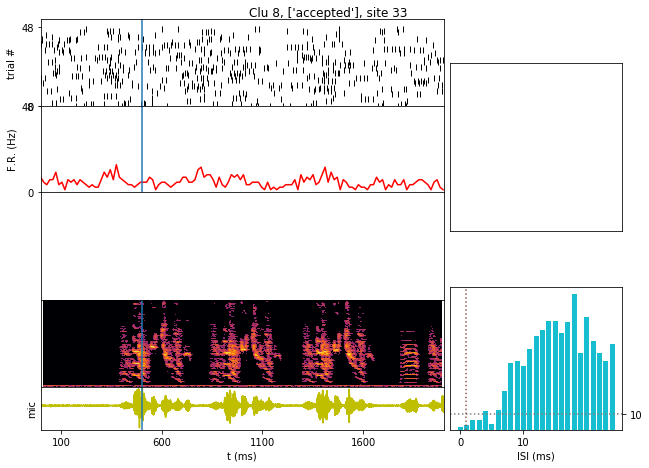

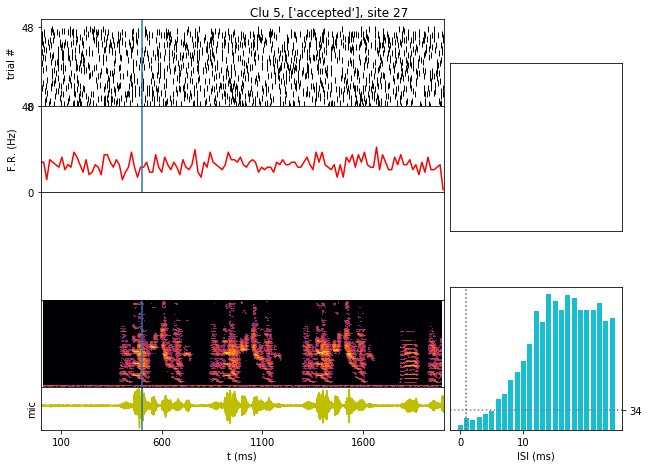

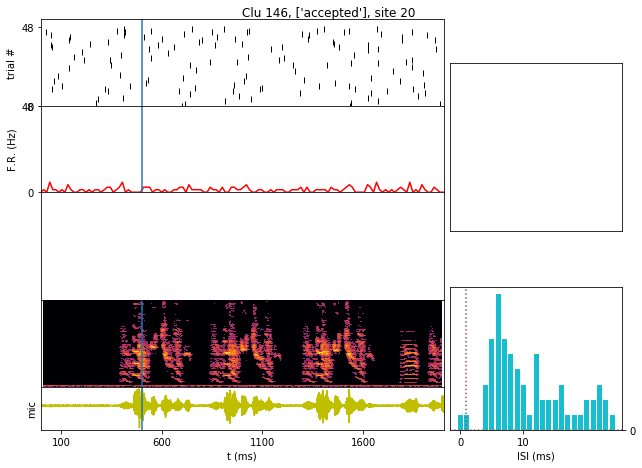

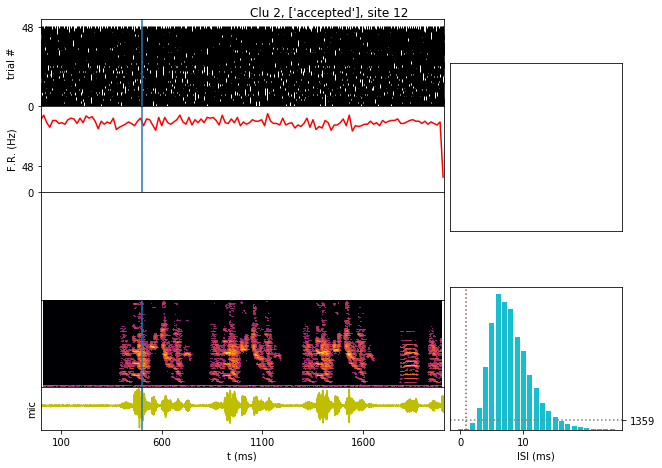

In [12]:
for clu in units_pd[units_pd['qlt']==2]['clu']: #qlt=2 is good unit in Kilosort language
    try:
        session.plot_unit_sgl(sess, clu, example_event_id=41)
    except:
        logger.warning('Fail in clu {}'.format(clu))

In [122]:
# list of good clusters with song modulated activity (by visual inspection of the rasters)
good_modulated = [99, 89, 87, 86, 83, 81, 78, 76, 75, 73, 71, 49, 44, 43, 42, 40, 39, 38, 37, 35, 31, 188, 185, 18, 177, 170, 168, 169, 160, 157, 156, 154, 150, 111, 108]
len(good_modulated)

35

### Same for the MUA clusters

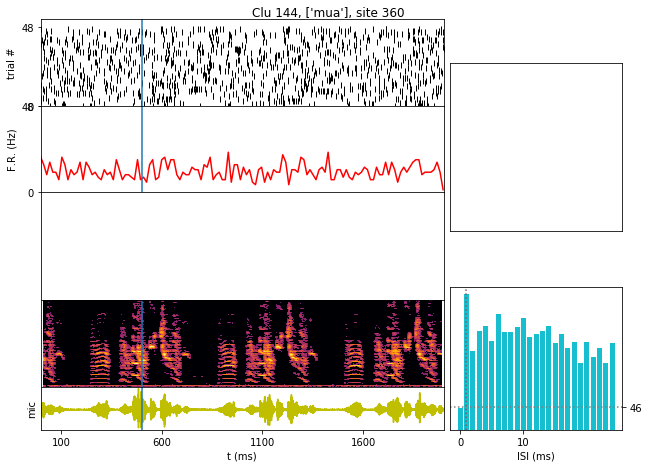

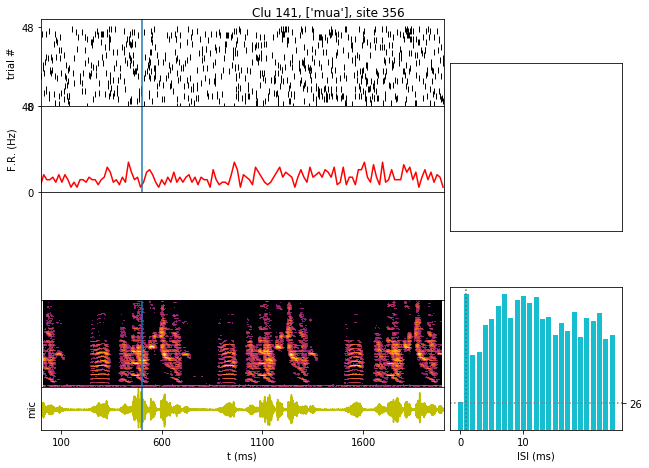

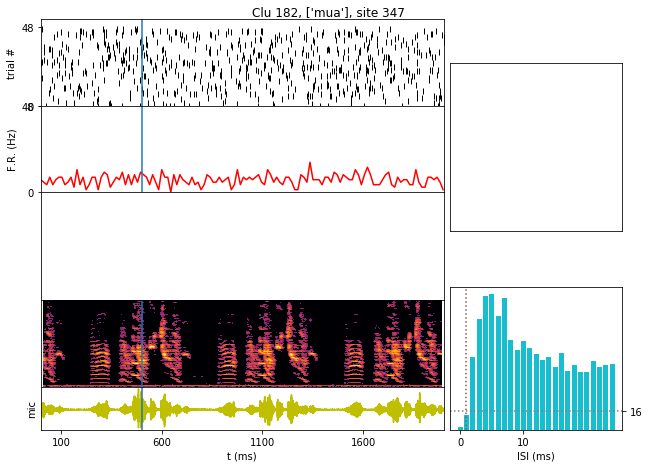

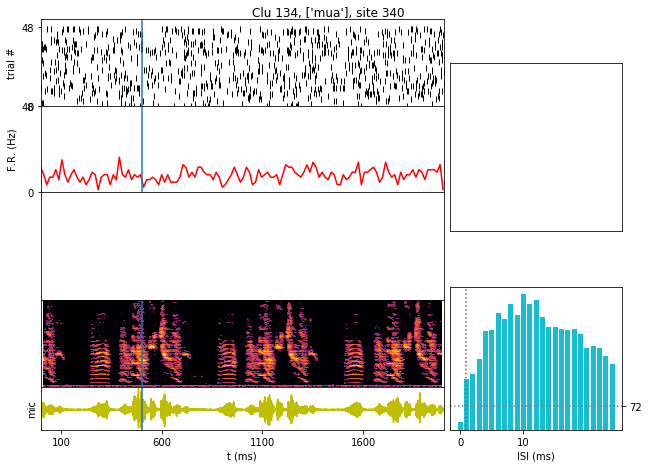

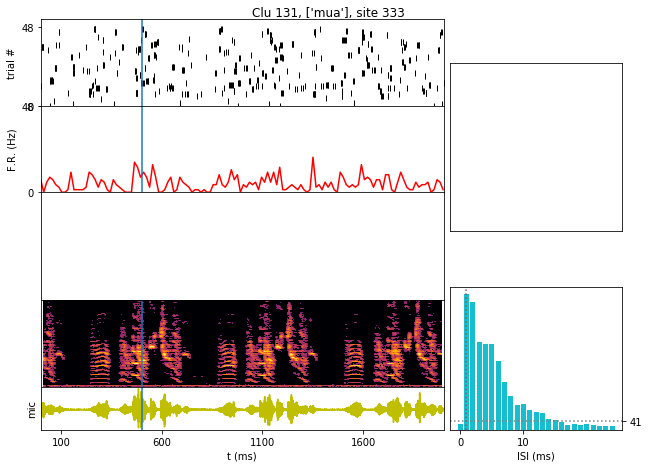

...

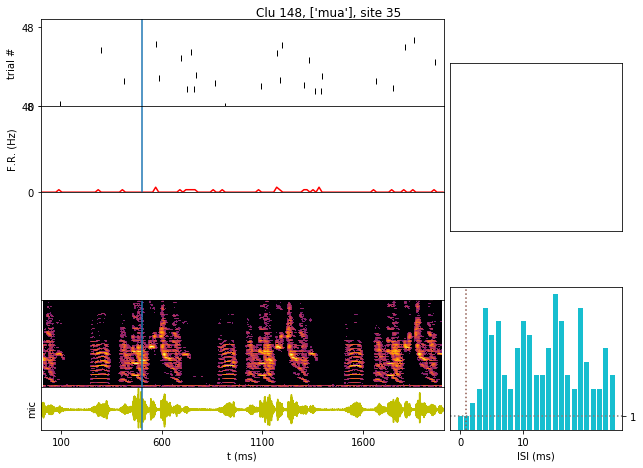

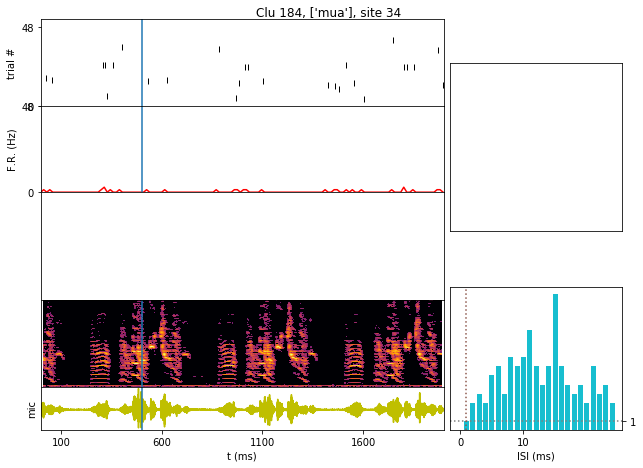

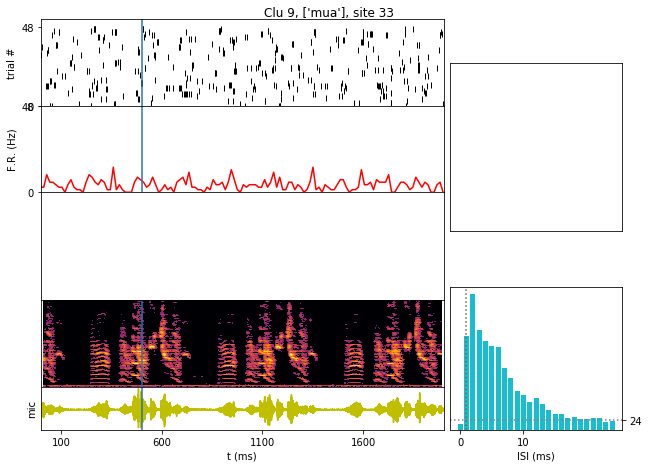

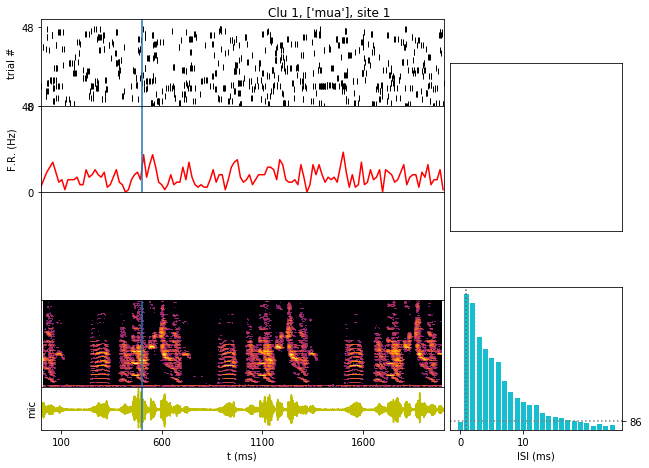

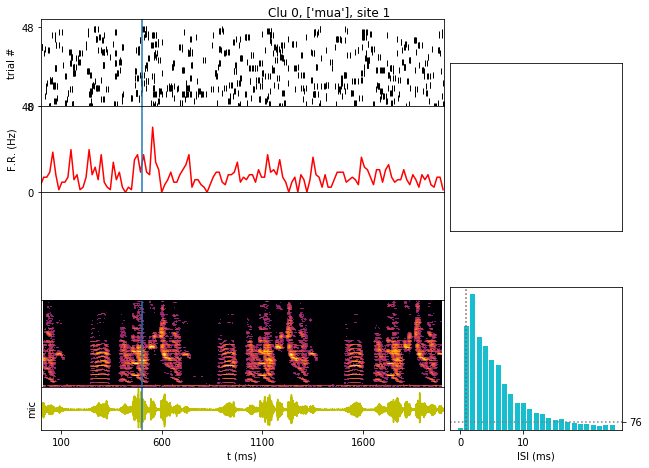

In [13]:
for clu in units_pd[units_pd['qlt']==1]['clu']:
    session.plot_unit_sgl(sess, clu, example_event_id=3)

In [123]:
mua_modulated = [101, 164, 165, 172, 187, 20, 22, 32, 36, 45, 60, 72, 74, 77, 80, 82, 95, 96]
len(mua_modulated)

18